In [1]:
# Spatial Transcriptomics Analysis

# Load packages
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib as mpl
import os
import gc

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.0 igraph==0.11.5 pynndescent==0.5.12


In [3]:
# Load data
folderpath = "/Users/christophertarkaa/Desktop/Bioinformatics/mouse_brain_visium_wo_cloupe_data/rawdata/ST8059048"
adata = sc.read_visium(folderpath, count_file='filtered_feature_bc_matrix.h5', load_images=True)

reading /Users/christophertarkaa/Desktop/Bioinformatics/mouse_brain_visium_wo_cloupe_data/rawdata/ST8059048/filtered_feature_bc_matrix.h5
 (0:00:00)


/opt/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/opt/anaconda3/lib/python3.11/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
# Make variable names unique
adata.var_names_make_unique()

In [5]:
adata

AnnData object with n_obs × n_vars = 2987 × 31053
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [6]:
# Inspection of the data
adata.obs.head()

,in_tissue,array_row,array_col
AAACAAGTATCTCCCA-1,1,50,102
AAACACCAATAACTGC-1,1,59,19
AAACAGAGCGACTCCT-1,1,14,94
AAACAGCTTTCAGAAG-1,1,43,9
AAACAGGGTCTATATT-1,1,47,13


In [7]:
adata.var.head()

,gene_ids,feature_types,genome
Xkr4,ENSMUSG00000051951,Gene Expression,mm10-3.0.0_premrna
Gm1992,ENSMUSG00000089699,Gene Expression,mm10-3.0.0_premrna
Gm37381,ENSMUSG00000102343,Gene Expression,mm10-3.0.0_premrna
Rp1,ENSMUSG00000025900,Gene Expression,mm10-3.0.0_premrna
Sox17,ENSMUSG00000025902,Gene Expression,mm10-3.0.0_premrna


normalizing counts per cell
    finished (0:00:00)


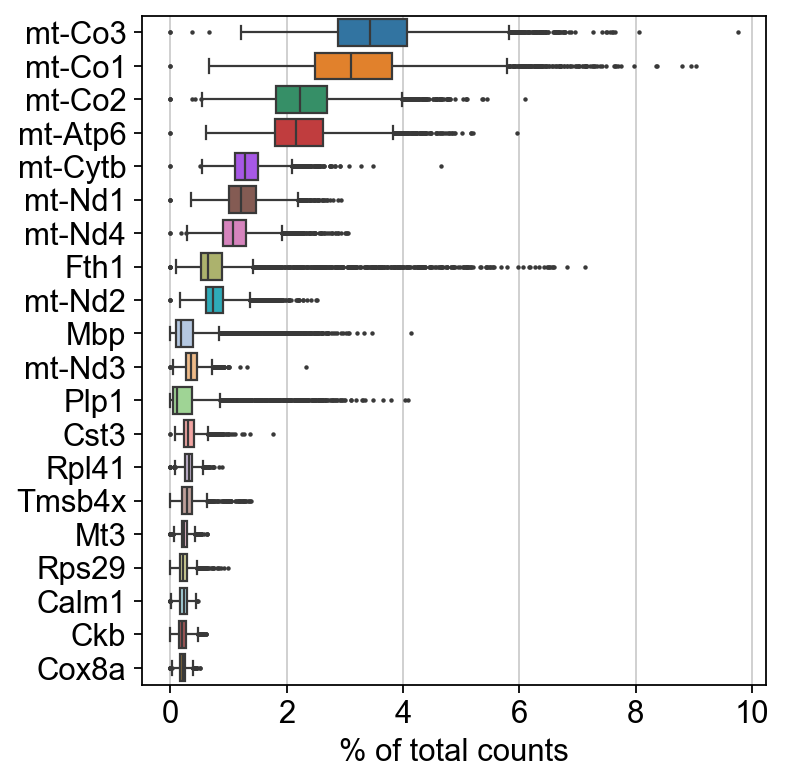

In [8]:
# Top 20 highly expressed genes
sc.pl.highest_expr_genes(adata, n_top=20)

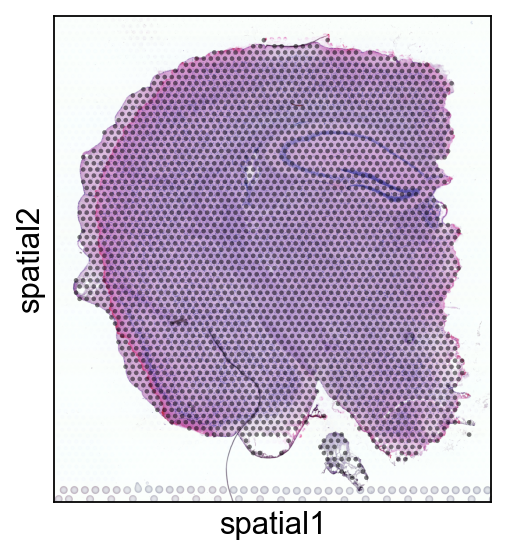

In [9]:
# Visualise the data
sc.pl.spatial(adata, img_key="hires", alpha=0.5)

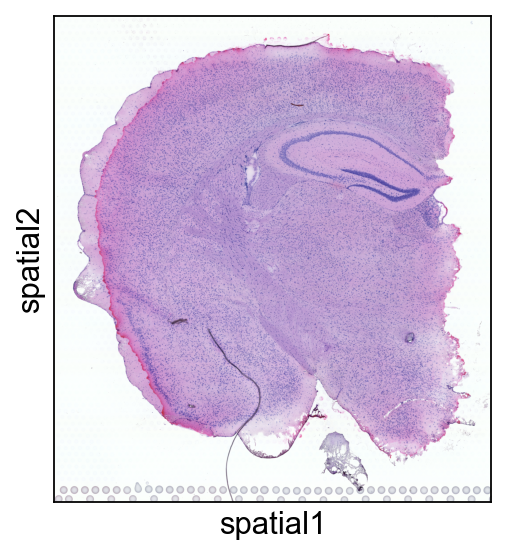

In [10]:
# Image with no overlay
sc.pl.spatial(adata, img_key="hires", color=None)

In [11]:
# Spatial plot of cells using gene expression levels of the most abundant gene and 2 other genes 'Rorb' and 'Vip'
gene_names = adata.var.index

print("Is Rorb gene present in the vars?", "Rorb" in gene_names)
print("Is Vip gene present in the vars?", "Vip" in gene_names)

Is Rorb gene present in the vars? True
Is Vip gene present in the vars? True


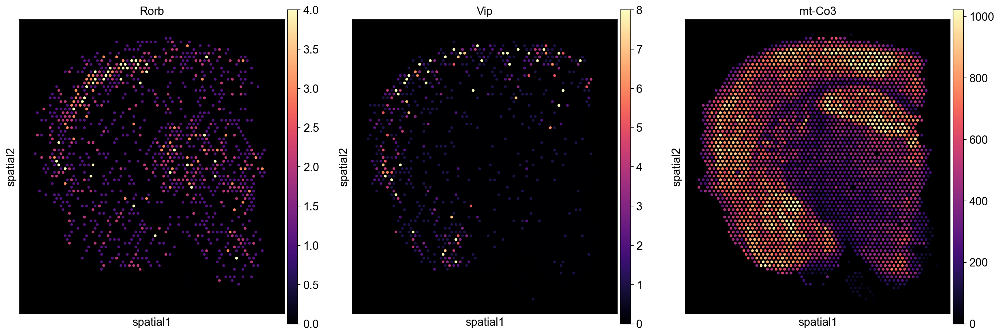

In [12]:
with mpl.rc_context({'figure.figsize': [6,7],
                     'axes.facecolor': 'black'}):
    sc.pl.spatial(adata, color=["Rorb", "Vip", "mt-Co3"], img_key=None, size=1,
                  vmin=0, cmap='magma', vmax='p99.0',
                  gene_symbols='SYMBOL'
                 )

In [13]:
# Quality control
# Mitochondrial genes
adata.var[adata.var.index.str.startswith('mt-')]

,gene_ids,feature_types,genome
mt-Nd1,ENSMUSG00000064341,Gene Expression,mm10-3.0.0_premrna
mt-Nd2,ENSMUSG00000064345,Gene Expression,mm10-3.0.0_premrna
mt-Co1,ENSMUSG00000064351,Gene Expression,mm10-3.0.0_premrna
mt-Co2,ENSMUSG00000064354,Gene Expression,mm10-3.0.0_premrna
mt-Atp8,ENSMUSG00000064356,Gene Expression,mm10-3.0.0_premrna
mt-Atp6,ENSMUSG00000064357,Gene Expression,mm10-3.0.0_premrna
mt-Co3,ENSMUSG00000064358,Gene Expression,mm10-3.0.0_premrna
mt-Nd3,ENSMUSG00000064360,Gene Expression,mm10-3.0.0_premrna
mt-Nd4l,ENSMUSG00000065947,Gene Expression,mm10-3.0.0_premrna
mt-Nd4,ENSMUSG00000064363,Gene Expression,mm10-3.0.0_premrna


In [14]:
# Tag all mitochondrial genes as True or False
adata.var['mt'] = adata.var_names.str.startswith('mt-')

In [15]:
adata.var

,gene_ids,feature_types,genome,mt
Xkr4,ENSMUSG00000051951,Gene Expression,mm10-3.0.0_premrna,False
Gm1992,ENSMUSG00000089699,Gene Expression,mm10-3.0.0_premrna,False
Gm37381,ENSMUSG00000102343,Gene Expression,mm10-3.0.0_premrna,False
Rp1,ENSMUSG00000025900,Gene Expression,mm10-3.0.0_premrna,False
Sox17,ENSMUSG00000025902,Gene Expression,mm10-3.0.0_premrna,False
...,...,...,...,...
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10-3.0.0_premrna,False
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10-3.0.0_premrna,False
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10-3.0.0_premrna,False
Vmn2r122,ENSMUSG00000096730,Gene Expression,mm10-3.0.0_premrna,False


In [16]:
# Similarly, lets get all the ribosomal genes
ribo_genes = pd.read_csv('https://www.gsea-msigdb.org/gsea/msigdb/human/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=CSV', skiprows=2, header=None)

In [17]:
ribo_genes

,0
0,FAU
1,MRPL13
2,RPL10
3,RPL10A
4,RPL10L
...,...
83,RPS9
84,RPSA
85,RSL24D1
86,RSL24D1P11


In [18]:
# Tag all ribosomal genes as True or False
adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)

In [19]:
adata.var

,gene_ids,feature_types,genome,mt,ribo
Xkr4,ENSMUSG00000051951,Gene Expression,mm10-3.0.0_premrna,False,False
Gm1992,ENSMUSG00000089699,Gene Expression,mm10-3.0.0_premrna,False,False
Gm37381,ENSMUSG00000102343,Gene Expression,mm10-3.0.0_premrna,False,False
Rp1,ENSMUSG00000025900,Gene Expression,mm10-3.0.0_premrna,False,False
Sox17,ENSMUSG00000025902,Gene Expression,mm10-3.0.0_premrna,False,False
...,...,...,...,...,...
AC168977.1,ENSMUSG00000079808,Gene Expression,mm10-3.0.0_premrna,False,False
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10-3.0.0_premrna,False,False
CAAA01118383.1,ENSMUSG00000063897,Gene Expression,mm10-3.0.0_premrna,False,False
Vmn2r122,ENSMUSG00000096730,Gene Expression,mm10-3.0.0_premrna,False,False


In [20]:
# Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], inplace=True)

In [21]:
adata


AnnData object with n_obs × n_vars = 2987 × 31053
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

In [22]:
# Get some metrics
number_of_spots = adata.obs_names.shape[0]
mean_reads_per_spot = adata.obs ['total_counts'].mean ()
median_genes_per_spot = adata.obs ['n_genes_by_counts'].median ()

In [23]:
print("Number of spots under tissue:", number_of_spots)
print ("Mean reads per spot:", mean_reads_per_spot)
print("Median genes per spot:", median_genes_per_spot)

Number of spots under tissue: 2987
Mean reads per spot: 15484.307
Median genes per spot: 4553.0


<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

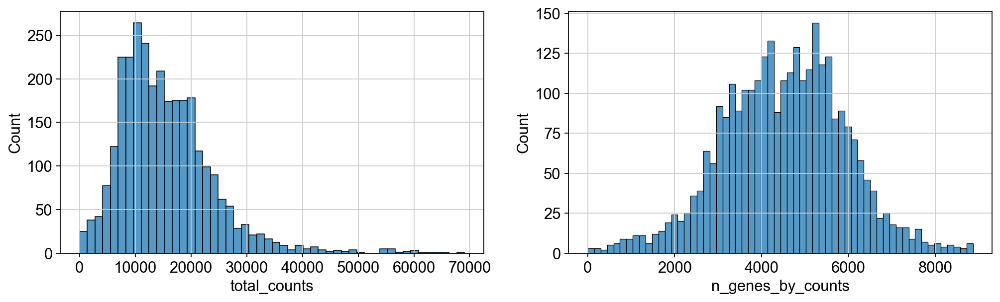

In [24]:
# Plot histogram of the total_counts column from the adata.obs dataframe and n_genes_by_counts column
fig, axs = plt.subplots(1, 2, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[1])

In [25]:
# Sort genes
adata.obs.sort_values('total_counts')

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo
CACAGTCCCGCTTCGC-1,1,60,112,3,1.386294,3.0,1.386294,100.000000,100.000000,100.000000,100.000000,0.0,0.000000,0.000000,0.0,0.0,0.0
AGCGATGCGCCTAATA-1,1,64,108,38,3.663562,43.0,3.784190,100.000000,100.000000,100.000000,100.000000,5.0,1.791759,11.627908,0.0,0.0,0.0
AGATACCAATAGAACC-1,1,64,110,66,4.204693,73.0,4.304065,78.082192,100.000000,100.000000,100.000000,7.0,2.079442,9.589041,0.0,0.0,0.0
GGAGTTGATTCTGTGT-1,1,68,112,179,5.192957,226.0,5.424950,42.920354,65.044248,100.000000,100.000000,42.0,3.761200,18.584070,0.0,0.0,0.0
AGAAGAGCGCCGTTCC-1,1,38,88,238,5.476464,295.0,5.690360,36.271186,53.220339,87.118644,100.000000,55.0,4.025352,18.644068,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CTGACTGCGCAGCTCG-1,1,31,101,8821,9.085004,61512.0,11.027004,17.407985,23.345038,31.385746,45.608987,3956.0,8.283241,6.431265,0.0,0.0,0.0
TGGCCAAACTGAAGTA-1,1,28,76,8444,9.041330,62504.0,11.043002,19.035582,25.241585,33.629848,48.248112,5111.0,8.539346,8.177077,0.0,0.0,0.0
CTAACGAAACTTGCTG-1,1,30,94,8861,9.089528,63739.0,11.062568,17.661087,23.684087,31.945904,45.893409,4152.0,8.331586,6.514065,0.0,0.0,0.0
TTGTTCAGTGTGCTAC-1,1,24,64,8457,9.042868,65866.0,11.095393,17.673762,24.381320,33.152157,48.190265,3352.0,8.117611,5.089120,0.0,0.0,0.0


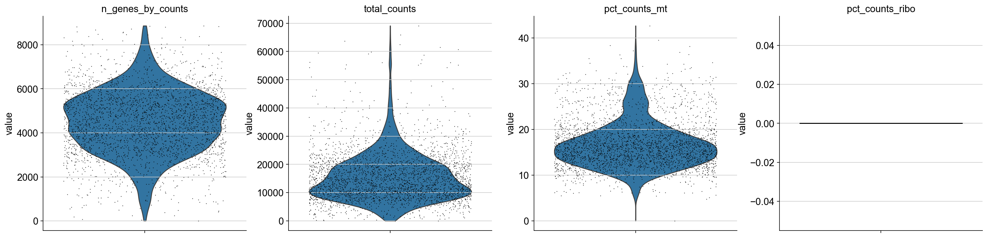

In [26]:
# Plot with violin plot
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

In [27]:
# Filtering 
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] <20]
adata = adata[adata.obs["pct_counts_ribo"] <2]

filtered out 145 cells that have less than 5000 counts
filtered out 81 cells that have more than 35000 counts


In [28]:
# Remove genes that are expressed in less than 10 cells
sc.pp.filter_genes(adata, min_cells=10)

filtered out 14374 genes that are detected in less than 10 cells


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:275: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


In [29]:
# Normalization
sc.pp.normalize_total(adata, inplace=True, target_sum=1e4)

normalizing counts per cell
    finished (0:00:00)


In [30]:
# Log transformation
sc.pp.log1p(adata)

In [31]:
# Identify highly variable genes
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [32]:
adata.var

,gene_ids,feature_types,genome,mt,ribo,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
Xkr4,ENSMUSG00000051951,Gene Expression,mm10-3.0.0_premrna,False,False,672,0.275527,0.243360,77.502511,823.0,6.714170,531,True,0.180298,0.046898,1.311122
Sox17,ENSMUSG00000025902,Gene Expression,mm10-3.0.0_premrna,False,False,126,0.044191,0.043243,95.781721,132.0,4.890349,99,False,0.030764,-0.166906,0.258982
Mrpl15,ENSMUSG00000033845,Gene Expression,mm10-3.0.0_premrna,False,False,1555,0.839973,0.609751,47.941078,2509.0,7.828038,1256,False,0.437216,-0.317163,-0.629049
Gm37988,ENSMUSG00000104217,Gene Expression,mm10-3.0.0_premrna,False,False,67,0.023770,0.023492,97.756947,71.0,4.276666,54,False,0.015004,-0.309664,-0.443534
Tcea1,ENSMUSG00000033813,Gene Expression,mm10-3.0.0_premrna,False,False,1284,0.640442,0.494966,57.013726,1913.0,7.556951,1033,False,0.339228,-0.306766,-0.584437
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vamp7,ENSMUSG00000051412,Gene Expression,mm10-3.0.0_premrna,False,False,1051,0.467359,0.383464,64.814195,1396.0,7.242083,851,False,0.268316,-0.258572,-0.192110
Spry3,ENSMUSG00000061654,Gene Expression,mm10-3.0.0_premrna,False,False,327,0.123535,0.116480,89.052561,369.0,5.913503,259,False,0.072066,-0.337245,-0.579263
Tmlhe,ENSMUSG00000079834,Gene Expression,mm10-3.0.0_premrna,False,False,55,0.019083,0.018903,98.158688,57.0,4.060443,41,False,0.012032,-0.265446,-0.225937
AC149090.1,ENSMUSG00000095041,Gene Expression,mm10-3.0.0_premrna,False,False,1524,0.933713,0.659442,48.978909,2789.0,7.933797,1234,False,0.441945,-0.263117,-0.397153


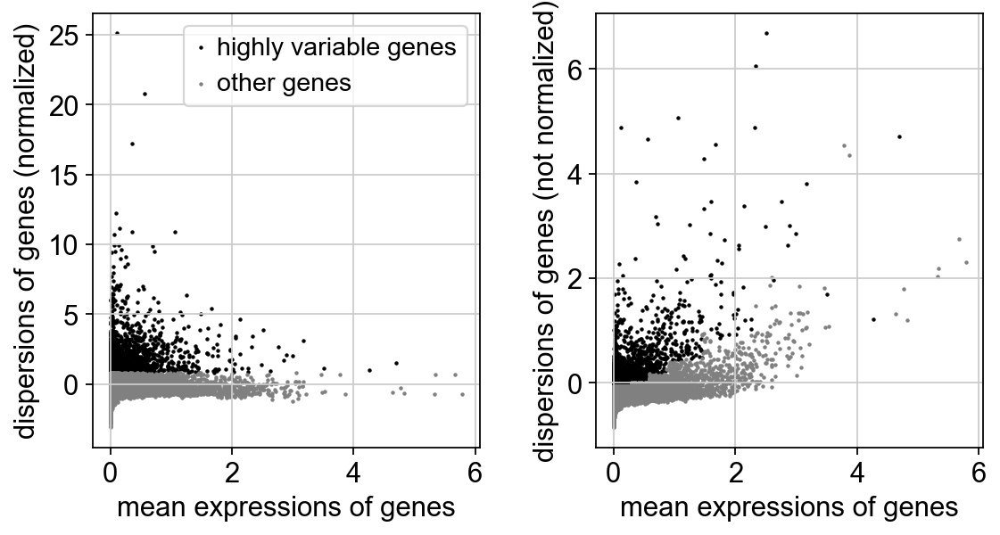

In [33]:
# Plot higly variable genes
sc.pl.highly_variable_genes(adata)

In [34]:
# Filter out the other genes and keep highly variable genes
adata = adata[:, adata.var.highly_variable]

computing PCA
    with n_comps=50
    finished (0:00:02)


/opt/anaconda3/lib/python3.11/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


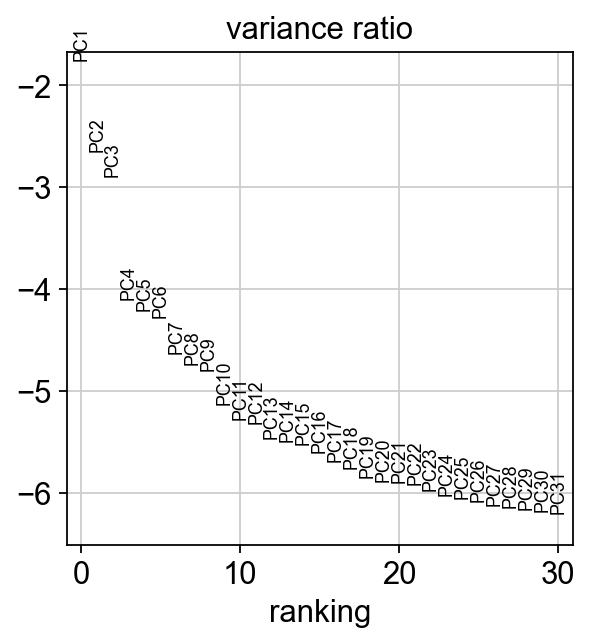

In [35]:
# Dimensionality reduction
# Principal component analysis
sc.pp.pca(adata)  # By default calculates 30 PCAs
# Plot principal components
sc.pl.pca_variance_ratio(adata, log=True)

In [36]:
# Finding the neighbors
sc.pp.neighbors(adata, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


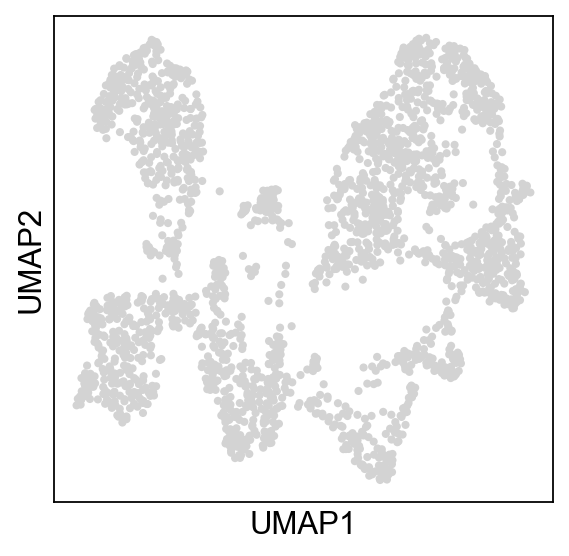

In [37]:
# Dimensionality reduction
# Uniform Manifold Approximation and Projection (UMAP)
sc.tl.umap(adata, n_components=2)
# Plot UMAP components to visualize the data
sc.pl.umap(adata)

In [38]:
# Lets take a look at the genes to pick the ones to visualize
sorted_by_num_cells = adata.var['n_cells_by_counts'].sort_values(ascending=False)
sorted_by_num_cells

Gm42418    2985
Cst3       2985
mt-Nd2     2984
Fth1       2982
Malat1     2962
           ... 
Gm816        11
Stmnd1       11
Sec14l4      11
Calcb        10
Gm13822      10
Name: n_cells_by_counts, Length: 2000, dtype: int64

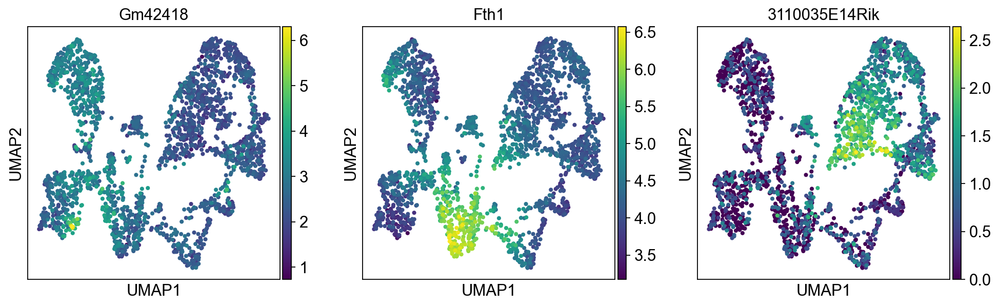

In [39]:
# Plot UMAP for specific genes
sc.pl.umap(adata, color=['Gm42418', 'Fth1', '3110035E14Rik'])

In [40]:
# Clustering using leiden algorithm
# pip install leidenalg
sc.tl.leiden(adata, resolution=0.6, key_added="clusters") # You have to experiment with the different values for cluster resolution - 0.2, 0.4, 0.6, etc

running Leiden clustering


/var/folders/z7/6grx_vds7rj1h9xg7_ftcjcw0000gn/T/ipykernel_5469/4033259279.py:3: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.6, key_added="clusters") # You have to experiment with the different values for cluster resolution - 0.2, 0.4, 0.6, etc


    finished: found 13 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


In [41]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,n_counts,clusters
AAACAAGTATCTCCCA-1,1,50,102,4678,8.450840,14284.0,9.566965,27.457295,32.812938,39.897788,52.856343,2847.0,7.954372,19.931393,0.0,0.0,0.0,14284.0,0
AAACAGAGCGACTCCT-1,1,14,94,6779,8.821732,32155.0,10.378354,23.784792,29.830508,37.860364,51.397916,4866.0,8.490233,15.132950,0.0,0.0,0.0,32155.0,5
AAACATTTCCCGGATT-1,1,61,97,5784,8.663024,20669.0,9.936439,21.147612,27.350138,35.744351,50.374958,2550.0,7.844241,12.337317,0.0,0.0,0.0,20669.0,1
AAACCGGGTAGGTACC-1,1,42,28,6334,8.753845,27359.0,10.216837,22.310757,28.389196,36.496217,50.506232,3416.0,8.136518,12.485836,0.0,0.0,0.0,27359.0,6
AAACCGTTCGTCCAGG-1,1,52,42,6843,8.831128,30272.0,10.318011,20.025106,26.149577,34.556686,48.592759,3464.0,8.150468,11.442918,0.0,0.0,0.0,30272.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTAGCAAATTCGA-1,1,22,42,5553,8.622274,19896.0,9.898324,22.502010,28.784680,36.886811,50.914757,2636.0,7.877397,13.248894,0.0,0.0,0.0,19896.0,6
TTGTTGTGTGTCAAGA-1,1,31,77,3464,8.150468,8785.0,9.080914,27.137166,33.249858,41.343199,55.310188,1586.0,7.369601,18.053501,0.0,0.0,0.0,8785.0,0
TTGTTTCACATCCAGG-1,1,58,42,5457,8.604838,19956.0,9.901335,23.872520,29.695330,37.748046,51.638605,2988.0,8.002694,14.972940,0.0,0.0,0.0,19956.0,3
TTGTTTCATTAGTCTA-1,1,60,30,5300,8.575651,18351.0,9.817493,24.892376,30.477903,38.194104,51.670209,3122.0,8.046550,17.012697,0.0,0.0,0.0,18351.0,3


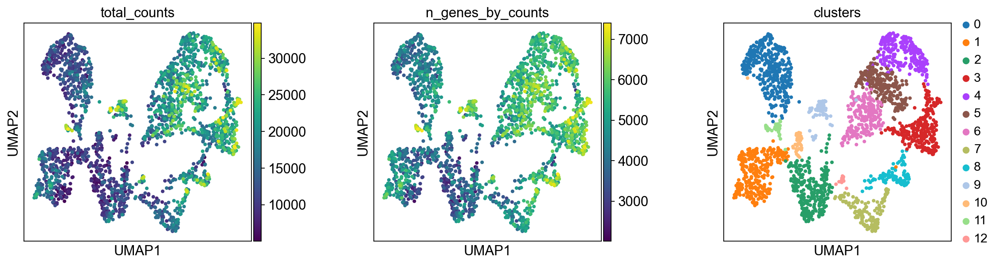

In [42]:
plt.rcParams["figure.figsize"] =(4,4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

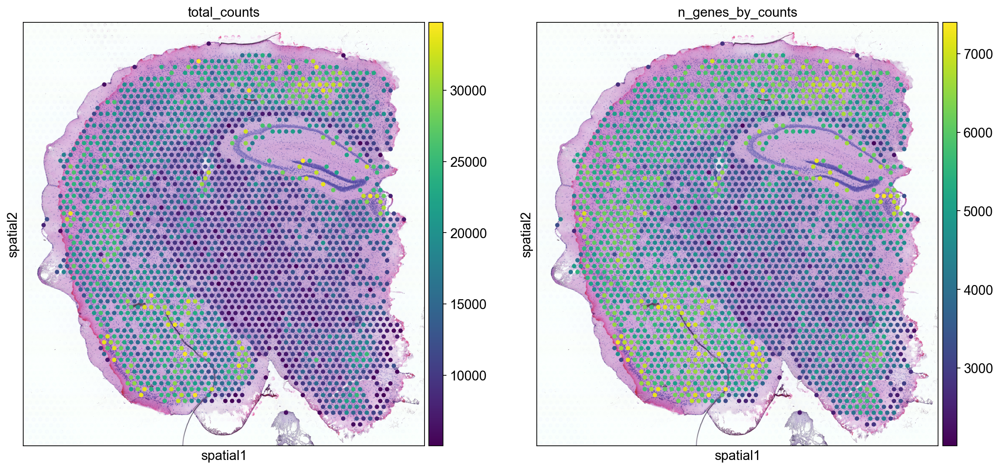

In [43]:
# Create a spatial plot of cells with color coded annotations for "total counts" and "n_genes_by_counts"
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color = ["total_counts", "n_genes_by_counts"])

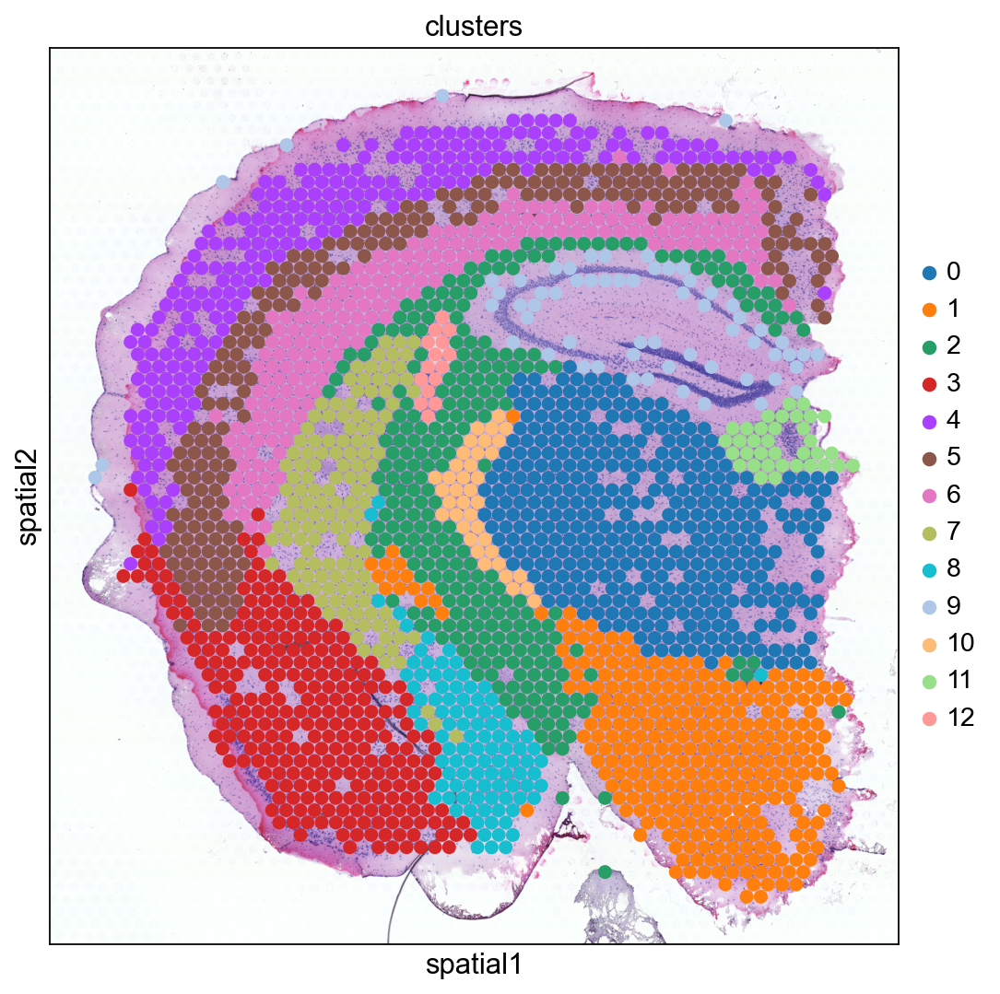

In [44]:
# Spatial plot of cells with color-coded anotations for clusters
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)

In [45]:
# Finding the marker genes
# Using t-test
sc.tl.rank_genes_groups(adata, "clusters", method="t-test") # Group by clusters and performs differential gene expression analysis

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


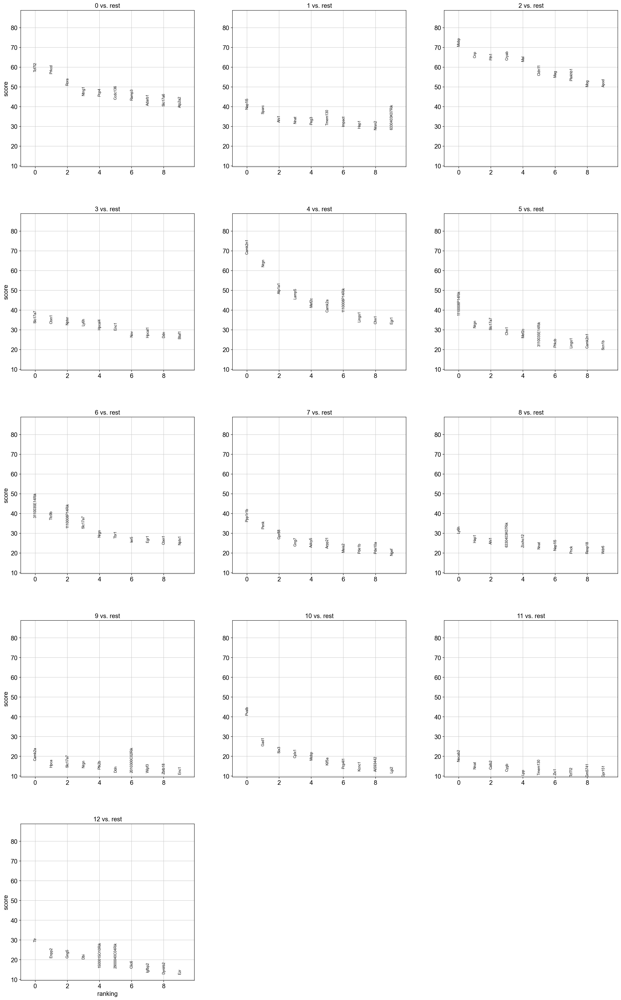

In [46]:
# Plot
sc.pl.rank_genes_groups(adata, n_genes=10, ncols=3)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 6


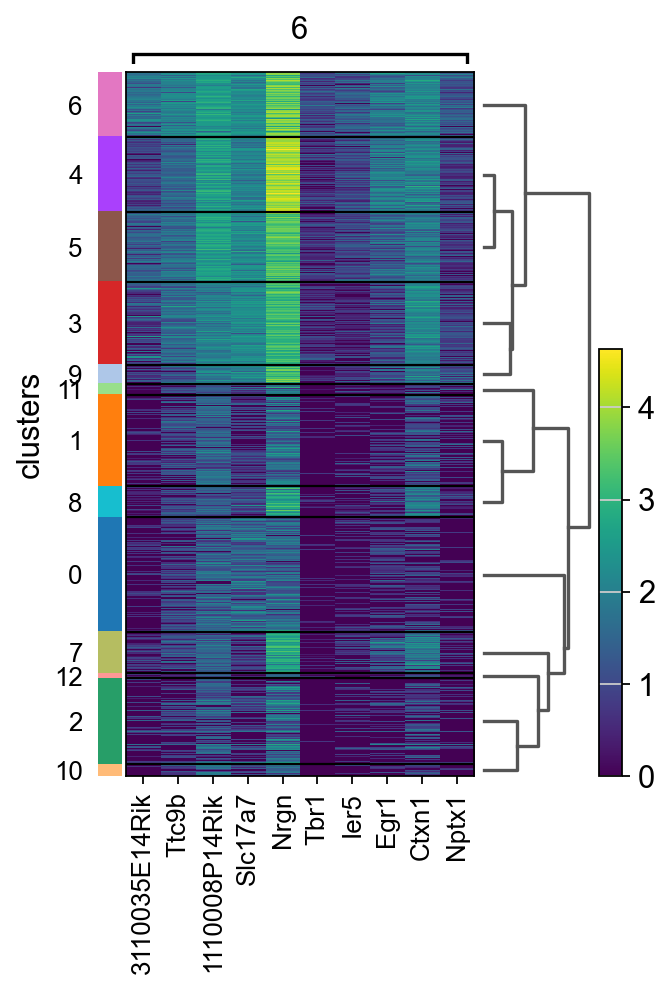

In [47]:
# Plot diifferentially expressed genes
sc.pl.rank_genes_groups_heatmap(adata, groups="6", n_genes=10, groupby="clusters")

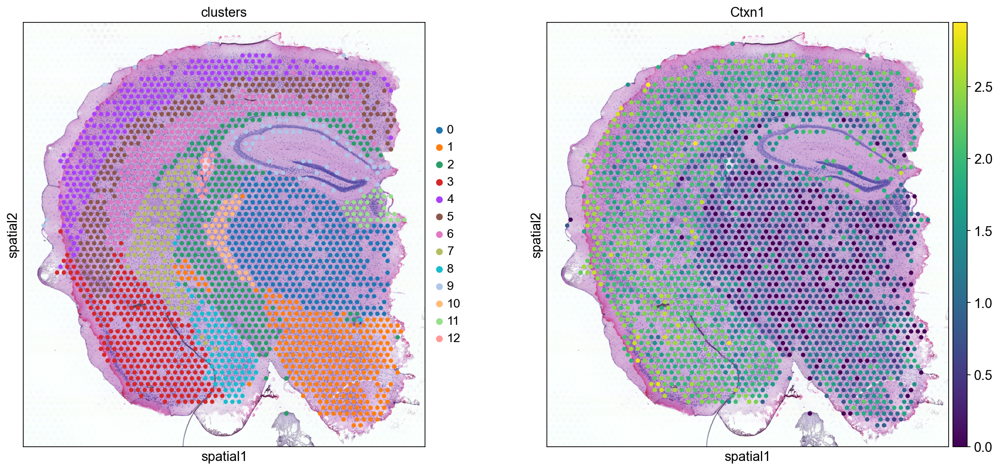

In [48]:
# Map a particular gene
plt.rcParams["figure.figsize"] = (8,8)
sc.pl.spatial(adata, img_key="hires", color=["clusters", "Ctxn1"])

In [49]:
# Obtain the top 10 genes for each cluster
result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
top_features = {}
n_top_genes = 10   # desired number of top genes per cluster
for group in groups:
    top_features[group] = result["names"][group][:n_top_genes]

# Print the top 10 genes in each cluster
for group, features in top_features.items():
    print(f"cluster {group} top features:")
    for feature in features:
        print(feature)
    print()


cluster 0 top features:
Tcf7l2
Prkcd
Rora
Ntng1
Pcp4
Ccdc136
Ramp3
Adarb1
Slc17a6
Atp2a2

cluster 1 top features:
Nap1l5
Sparc
Ahi1
Nnat
Peg3
Tmem130
Impact
Hap1
Nrsn2
6330403K07Rik

cluster 2 top features:
Mobp
Cnp
Fth1
Cryab
Mal
Cldn11
Mag
Plekhb1
Mog
Apod

cluster 3 top features:
Slc17a7
Ctxn1
Nptxr
Ly6h
Hpcal4
Enc1
Nov
Hpcal1
Ddn
Btaf1

cluster 4 top features:
Camk2n1
Nrgn
Atp1a1
Lamp5
Mef2c
Camk2a
1110008P14Rik
Lingo1
Chn1
Egr1

cluster 5 top features:
1110008P14Rik
Nrgn
Slc17a7
Chn1
Mef2c
3110035E14Rik
Prkcb
Lingo1
Camk2n1
Scn1b

cluster 6 top features:
3110035E14Rik
Ttc9b
1110008P14Rik
Slc17a7
Nrgn
Tbr1
Ier5
Egr1
Ctxn1
Nptx1

cluster 7 top features:
Ppp1r1b
Penk
Gpr88
Gng7
Adcy5
Arpp21
Meis2
Pde1b
Pde10a
Ngef

cluster 8 top features:
Ly6h
Hap1
Ahi1
6330403K07Rik
Zcchc12
Nnat
Nap1l5
Pnck
Resp18
Wdr6

cluster 9 top features:
Camk2a
Hpca
Slc17a7
Nrgn
Ptk2b
Ddn
2010300C02Rik
Wipf3
Zbtb18
Enc1

cluster 10 top features:
Pvalb
Gad1
Six3
Cplx1
Mobp
Kif5a
Pcp4l1
Kcnc1
AI593442
Lgi2

clus

In [50]:
# Export results to csv
dat = pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'logfoldchanges','scores','pvals']})
dat.to_csv("scanpy_result.csv") 

In [51]:
result = pd.read_csv('scanpy_result.csv')

In [52]:
result

,Unnamed: 0,0_n,0_l,0_s,0_p,1_n,1_l,1_s,1_p,2_n,...,10_s,10_p,11_n,11_l,11_s,11_p,12_n,12_l,12_s,12_p
0,0,Tcf7l2,4.615604,57.663890,3.906651e-207,Nap1l5,1.954508,38.719143,1.386344e-144,Mobp,...,40.849358,1.766744e-34,Necab2,3.632229,17.343302,1.061581e-18,Ttr,8.381594,28.960830,5.303977e-14
1,1,Prkcd,4.858848,56.749690,4.277336e-196,Sparc,2.024012,36.364933,2.895484e-140,Cnp,...,25.221890,9.265116e-26,Nnat,2.102462,13.618059,5.072135e-16,Enpp2,5.548840,20.997866,4.074263e-12
2,2,Rora,3.358253,50.781390,3.550571e-194,Ahi1,2.269492,31.950975,1.292892e-110,Fth1,...,21.651724,9.994843e-23,Calb2,3.899688,13.498601,2.304154e-15,Gng5,2.417606,20.965912,1.703718e-12
3,3,Ntng1,4.010963,45.594580,3.308735e-164,Nnat,2.301426,31.448235,1.147181e-114,Cryab,...,19.218030,1.948052e-22,Cygb,2.645049,12.316557,2.902501e-14,Dbi,2.377836,20.388280,3.121341e-12
4,4,Pcp4,2.415983,45.311718,1.036500e-207,Peg3,2.071518,30.978107,3.449004e-106,Mal,...,18.093773,2.908424e-22,Lpp,2.618262,10.536587,2.461335e-12,1500015O10Rik,7.411041,15.875587,2.328032e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1995,Gda,-2.769693,-27.288343,3.600266e-123,Camk2n1,-1.390982,-25.026718,1.330086e-91,Rgs4,...,-19.958664,1.244009e-81,Nfe2l3,-25.819307,-14.349591,1.012730e-44,Ubash3b,-27.431847,-26.156076,8.368693e-132
1996,1996,Ngef,-2.309446,-27.683596,3.238334e-118,Nrgn,-1.801514,-25.386608,1.687662e-95,Rasgrp1,...,-21.373838,2.654899e-92,Egr1,-2.770973,-15.715620,2.466849e-19,Unc13c,-27.800581,-27.900742,2.926700e-147
1997,1997,Ctxn1,-2.086215,-29.709543,4.078816e-122,Rasgrp1,-2.136542,-26.379234,4.446570e-94,Chn1,...,-21.881048,3.038340e-96,Opn3,-26.415724,-17.602846,5.050324e-65,Cntnap5a,-27.682756,-29.127996,2.028065e-158
1998,1998,Baiap2,-2.686699,-31.232676,1.453302e-144,Cck,-1.811034,-31.321480,2.421381e-125,Lingo1,...,-25.297310,3.055795e-124,Rxrg,-26.337307,-17.670101,1.778809e-65,Ptpro,-27.766724,-29.599667,9.131640e-163


In [53]:
# Cell type annotation
!pwd

/Users/christophertarkaa


In [54]:
!git clone https://github.com/bioinfo-ibms-pumc/SCSA

Cloning into 'SCSA'...
remote: Enumerating objects: 187, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 187 (delta 32), reused 43 (delta 18), pack-reused 123
Receiving objects: 100% (187/187), 37.53 MiB | 2.34 MiB/s, done.
Resolving deltas: 100% (101/101), done.


In [55]:
!pip install openpyxl

In [56]:
cd SCSA

/Users/christophertarkaa/SCSA


In [57]:
ls

LICENSE                 scanpy_pbmc_3k.csv      user.table
README.md               scran_pbmc_3k.csv       whole.db
SCSA.py                 seurat_GSE72056.csv     whole_v2.db
cellranger_pbmc_3k.csv  seurat_mouse.csv


In [66]:
!python SCSA.py -h

usage: SCSA.py [-h] -i INPUT [-o OUTPUT] [-d DB] [-s SOURCE] [-c CLUSTER]
               [-M MARKERDB] [-f FOLDCHANGE] [-p PVALUE] [-w WEIGHT]
               [-g SPECIES] [-k TISSUE] [-m OUTFMT] [-T CELLTYPE] [-t TARGET]
               [-E] [-N] [-b] [-l]

Program: SCSA
  Version: 1.0
  Email  : <yhcao@ibms.pumc.edu.cn>
        

options:
  -h, --help            show this help message and exit
  -i INPUT, --input INPUT
                        Input file for marker annotation(Only CSV format
                        supported).
  -o OUTPUT, --output OUTPUT
                        Output file for marker annotation.
  -d DB, --db DB        Database for annotation. (whole.db)
  -s SOURCE, --source SOURCE
                        Source of marker genes.
                        (cellranger,[seurat],[scanpy],[scran])
  -c CLUSTER, --cluster CLUSTER
                        Only deal with one cluster of marker genes.
                        (all,[1],[1,2,3],[...])
  -M MARKERDB, --MarkerDB MARKER

In [72]:
!python SCSA.py -d whole.db -i /Users/christophertarkaa/scanpy_result.csv -s scanpy -E -g Mouse -f1.5 -p 0.01 -o result.txt -m txt

Version V1.1 [2020/07/03]
DB load: 47347 3 3 48257 37440
Namespace(input='/Users/christophertarkaa/scanpy_result.csv', output='result.txt', db='whole.db', source='scanpy', cluster='all', MarkerDB=None, foldchange=1.5, pvalue=0.01, weight=100.0, species='Mouse', tissue='All', outfmt='txt', celltype='normal', target='cellmarker', Gensymbol=True, norefdb=False, noprint=False, list_tissue=False)
Version V1.1 [2020/07/03]
DB load: 47347 3 3 48257 37440
load markers: 45409
############################## Cluster 0 ##############################

Cell Num: 86
Gene Num: 142
Not Zero: 276
Cluster 0 Gene number: 211
------------------------------------------------------------
Type                Cell Type           Score     Times
------------------------------------------------------------
?             Brush cell (Tuft cell)    5.1624    1.3  
------------------------------------------------------------
            (Hematopoietic stem cell)  (4.0787)
--------------------------------------------

In [89]:
# Read the text document into a DataFrame
df = pd.read_csv('/Users/christophertarkaa/SCSA/result.txt', sep='\t')
df

,Cell Type,Z-score,Cluster
0,Brush cell (Tuft cell),5.162364,0
1,Hematopoietic stem cell,4.078700,0
2,Type IC spiral ganglion neuron,3.063160,0
3,Ciliated cell,2.645315,0
4,Type I spiral ganglion neuron,2.333129,0
...,...,...,...
896,Basket cell,-0.407660,9
897,Enteroendocrine precursor cell,-0.408087,9
898,Paneth cell,-0.409515,9
899,Collecting duct transient cell,-0.409515,9


In [76]:
# Group the data by "Cluster" and find the cell type with the highest Z-score in each group
highest_zscores = df.groupby('Cluster')['Z-score'].idxmax()

# Extract the corresponding cell types for the highest Z-scores
cell_types_with_highest_zscores = df.loc[highest_zscores, 'Cell Type'].tolist()
cell_types_with_highest_zscores

['Brush cell (Tuft cell)',
 'Osteoclast',
 'Brush cell (Tuft cell)',
 'B cell',
 'Cardiomyocyte',
 'Cardiomyocyte',
 'Ciliated cell',
 'T cell',
 'Osteoclast',
 'Ciliated cell',
 'Type I spiral ganglion neuron',
 'Type IC spiral ganglion neuron',
 'Ciliated cell']

In [77]:
# Create a dictionary of cluster value (number) and corresponding identified cell type
cluster_to_cell_type = {cluster_num: cell_type for cluster_num, cell_type in enumerate(cell_types_with_highest_zscores)}
cluster_to_cell_type

{0: 'Brush cell (Tuft cell)',
 1: 'Osteoclast',
 2: 'Brush cell (Tuft cell)',
 3: 'B cell',
 4: 'Cardiomyocyte',
 5: 'Cardiomyocyte',
 6: 'Ciliated cell',
 7: 'T cell',
 8: 'Osteoclast',
 9: 'Ciliated cell',
 10: 'Type I spiral ganglion neuron',
 11: 'Type IC spiral ganglion neuron',
 12: 'Ciliated cell'}

In [78]:
adata.obs['clusters']


AAACAAGTATCTCCCA-1    0
AAACAGAGCGACTCCT-1    5
AAACATTTCCCGGATT-1    1
AAACCGGGTAGGTACC-1    6
AAACCGTTCGTCCAGG-1    3
                     ..
TTGTTAGCAAATTCGA-1    6
TTGTTGTGTGTCAAGA-1    0
TTGTTTCACATCCAGG-1    3
TTGTTTCATTAGTCTA-1    3
TTGTTTCCATACAACT-1    5
Name: clusters, Length: 2253, dtype: category
Categories (13, object): ['0', '1', '2', '3', ..., '9', '10', '11', '12']

In [79]:
# Current cluster assignment has dtype of str (not Int). Let us change str to int before mapping clusters to cell types.
adata.obs['clusters'] = adata.obs['clusters'].astype(int)

In [80]:
# Map cluster numbers to cell types.
adata.obs['cell_types'] = adata.obs['clusters'].map(cluster_to_cell_type)

In [81]:
adata.obs


,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,n_counts,clusters,cell_types
AAACAAGTATCTCCCA-1,1,50,102,4678,8.450840,14284.0,9.566965,27.457295,32.812938,39.897788,52.856343,2847.0,7.954372,19.931393,0.0,0.0,0.0,14284.0,0,Brush cell (Tuft cell)
AAACAGAGCGACTCCT-1,1,14,94,6779,8.821732,32155.0,10.378354,23.784792,29.830508,37.860364,51.397916,4866.0,8.490233,15.132950,0.0,0.0,0.0,32155.0,5,Cardiomyocyte
AAACATTTCCCGGATT-1,1,61,97,5784,8.663024,20669.0,9.936439,21.147612,27.350138,35.744351,50.374958,2550.0,7.844241,12.337317,0.0,0.0,0.0,20669.0,1,Osteoclast
AAACCGGGTAGGTACC-1,1,42,28,6334,8.753845,27359.0,10.216837,22.310757,28.389196,36.496217,50.506232,3416.0,8.136518,12.485836,0.0,0.0,0.0,27359.0,6,Ciliated cell
AAACCGTTCGTCCAGG-1,1,52,42,6843,8.831128,30272.0,10.318011,20.025106,26.149577,34.556686,48.592759,3464.0,8.150468,11.442918,0.0,0.0,0.0,30272.0,3,B cell
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTAGCAAATTCGA-1,1,22,42,5553,8.622274,19896.0,9.898324,22.502010,28.784680,36.886811,50.914757,2636.0,7.877397,13.248894,0.0,0.0,0.0,19896.0,6,Ciliated cell
TTGTTGTGTGTCAAGA-1,1,31,77,3464,8.150468,8785.0,9.080914,27.137166,33.249858,41.343199,55.310188,1586.0,7.369601,18.053501,0.0,0.0,0.0,8785.0,0,Brush cell (Tuft cell)
TTGTTTCACATCCAGG-1,1,58,42,5457,8.604838,19956.0,9.901335,23.872520,29.695330,37.748046,51.638605,2988.0,8.002694,14.972940,0.0,0.0,0.0,19956.0,3,B cell
TTGTTTCATTAGTCTA-1,1,60,30,5300,8.575651,18351.0,9.817493,24.892376,30.477903,38.194104,51.670209,3122.0,8.046550,17.012697,0.0,0.0,0.0,18351.0,3,B cell


In [82]:
adata.obs["cell_types"].unique()

array(['Brush cell (Tuft cell)', 'Cardiomyocyte', 'Osteoclast',
       'Ciliated cell', 'B cell', 'Type IC spiral ganglion neuron',
       'T cell', 'Type I spiral ganglion neuron'], dtype=object)

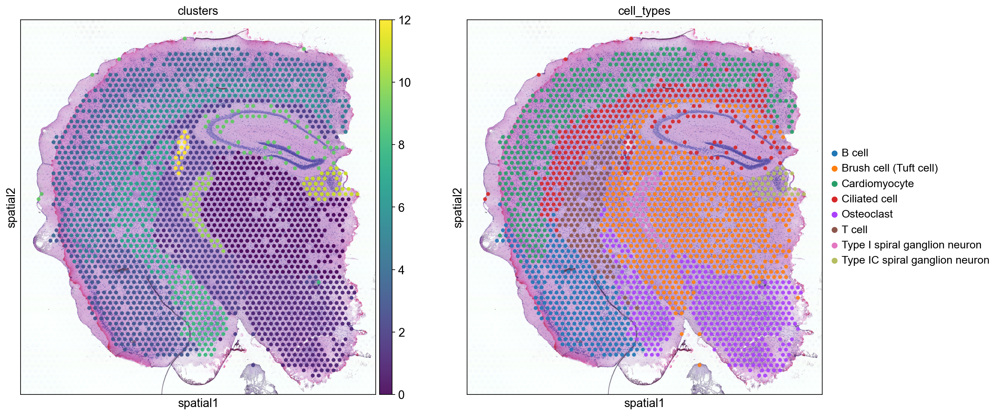

In [83]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "cell_types"], alpha=0.9)

In [87]:
df.head()


,Cell Type,Z-score,Cluster
0,Brush cell (Tuft cell),5.162364,0
1,Hematopoietic stem cell,4.078700,0
2,Type IC spiral ganglion neuron,3.063160,0
3,Ciliated cell,2.645315,0
4,Type I spiral ganglion neuron,2.333129,0
